#### **Import Libraries**

In [2]:
import jax 
import jax.numpy as jnp
import optax 
import matplotlib.pyplot as plt
from pathlib import Path
from functools import partial 
import os 
import flax 
import numpy as np
from rfp import MLP, Model, ModelParams
from rfp.utils import batch_matrix_with_padding
from rfp.losses import binary_cross_entropy, Supervised_Loss, mse, Cluster_Loss
from rfp.train import Trainer
import pickle 
from collections import OrderedDict
from tqdm import tqdm
import pickle
import textwrap
import jax
jax.config.update("jax_debug_nans", True)
import math

#### **Plotting**

In [3]:
%matplotlib inline
%config InlineBackend.figure_format = 'svg'

#### **Define Paths**

In [4]:
base_folder = str(Path(os.getcwd()).parent.parent.absolute())
np_link = base_folder + f"/evictions/data_np/prompt_scraped_data_False.npz"
print(base_folder)

/home/ubuntu


#### **Parameterize Notebook**

In [5]:
outcome_label = 'legalaid'
outcome_status = 'binary'       # Needed for the final activation of the neural network
covariates_label = 'Four'
instrument_label = 'treatment'
cluster_label = 'zipcodes'
split_frac = 0.5
sims = 25
outer_epochs = 1000
nodes = 32
outer_lr = 0.01
inner_lr = 0.01
inner_epochs = 1

#### **Read In Data**

In [6]:
# Load numpy data
loaded_data = np.load(np_link, allow_pickle=True)

# Cluster Variable
cluster_idx = loaded_data[cluster_label]

# Feature Matrix
X = loaded_data[covariates_label][:,1:]
min_val = jnp.min(X, axis=0)
max_val = jnp.max(X, axis=0)
X_normalized = (X - min_val) / (max_val - min_val)
X_normalized_batch, cluster_mask = batch_matrix_with_padding(X_normalized, cluster_idx)
print(f"Feature shape: \t\t\t{X_normalized.shape}")
print(f"Feature Batch shape: \t\t{X_normalized_batch.shape}")
print(f"Mask shape: \t\t\t{cluster_mask.shape}")

# Target
Y = loaded_data[outcome_label]
Y_batch, _ = batch_matrix_with_padding(Y, cluster_idx)
print(f"Outcome Shape: \t\t\t{Y.shape}")
print(f"Outcome Batch Shape: \t\t{Y_batch.shape}")

# Instrument
Z = loaded_data[instrument_label]

# Treatment ++ Instrument 
XZ_normalized = jnp.hstack([X_normalized, Z]) 
XZ_normalized_batch, _ = batch_matrix_with_padding(XZ_normalized, cluster_idx)
print(f"Inputs Shape: \t\t\t{XZ_normalized.shape}")
print(f"Inputs Batch Shape: \t\t{XZ_normalized_batch.shape}")

sample_weights =  loaded_data['sample_weight']
print(f"Min 'Raw' sample weight: {jnp.min(sample_weights)}, Max 'Raw' sample weight: {jnp.max(sample_weights)}")
normalized_weights = (sample_weights / jnp.sum(sample_weights))
print(f"Weight Shape: \t\t\t{normalized_weights.shape}")


2024-04-13 23:31:07.977706: W external/xla/xla/service/gpu/nvptx_compiler.cc:718] The NVIDIA driver's CUDA version is 12.2 which is older than the ptxas CUDA version (12.4.131). Because the driver is older than the ptxas version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility packages.


Feature shape: 			(9797, 29)
Feature Batch shape: 		(171, 516, 29)
Mask shape: 			(171, 516, 1)
Outcome Shape: 			(9797, 1)
Outcome Batch Shape: 		(171, 516, 1)
Inputs Shape: 			(9797, 30)
Inputs Batch Shape: 		(171, 516, 30)
Min 'Raw' sample weight: 1.0, Max 'Raw' sample weight: 4.461538314819336
Weight Shape: 			(9797,)


#### **Bar Graph of Eviction Filings by Cluster**

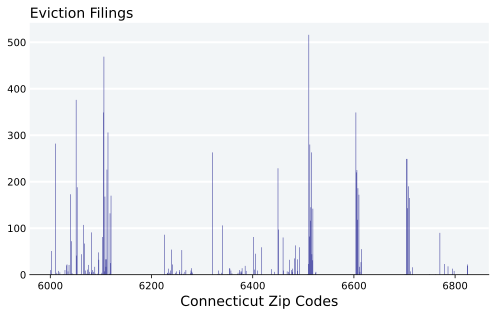

In [7]:
# Compute the unique elements and their counts
fig = plt.figure(dpi=300, tight_layout=True, figsize=(7, 4.5))
ax = plt.axes(facecolor=(.95, .96, .97))

# Plot customizations
for key in 'left', 'right', 'top':
    ax.spines[key].set_visible(False)
ax.text(0., 1.02, s='Eviction Filings', transform=ax.transAxes, size=14)
ax.yaxis.set_tick_params(length=0)
ax.yaxis.grid(True, color='white', linewidth=2)
ax.set_axisbelow(True)

unique_elements, counts = np.unique(cluster_idx, return_counts=True)

# Plotting the bar graph
plt.bar(unique_elements, counts, color='navy')

plt.xlabel('Connecticut Zip Codes',size=14)
plt.show()


#### **Setup**

In [8]:
features = XZ_normalized.shape[1] 
mlp = MLP([nodes, nodes], jax.nn.relu)
model = Model(mlp, jax.nn.sigmoid if outcome_status == 'binary' else lambda x: x)
supervised_loss = Supervised_Loss(binary_cross_entropy, model.embellished_fwd_pass, reg_value=0, aux_status=False)
inner_yuri = Trainer(supervised_loss, optax.sgd(learning_rate=inner_lr), inner_epochs)
cluster_loss = Cluster_Loss(inner_yuri, reg_value=0.9)
yuri = Trainer(cluster_loss, optax.sgd(learning_rate=outer_lr), outer_epochs)

#### **Initial Predictions**

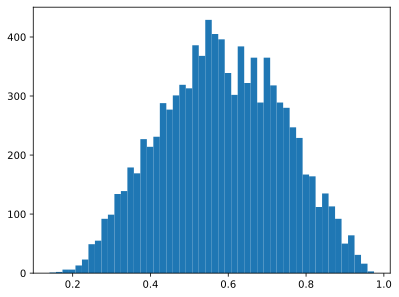

In [9]:
def hist_predictions(key):
    params = ModelParams.init_fn(key, mlp, features)
    yhat = model.fwd_pass(params, XZ_normalized)
    plt.hist(yhat.reshape(-1,), bins=50)
    plt.show()

hist_predictions(jax.random.PRNGKey(0))


#### **Training**

In [10]:
StandardResults = {}
key = jax.random.PRNGKey(0)
for i in tqdm(range(sims)):

    # Create Keys
    key, subkey1, subkey2, subkey3, subkey4 = jax.random.split(key, 5)

    # Initialize the parameters
    params = ModelParams.init_fn(subkey1, mlp, features)

    # Split Train and Validation Data
    idx = jax.random.permutation(subkey2, XZ_normalized.shape[0])

    # Training Indices
    train_idx = idx[:int(split_frac * XZ_normalized.shape[0])]
    p_train = normalized_weights[train_idx]/jnp.sum(normalized_weights[train_idx])
    train_idx = jax.random.choice(subkey3, train_idx, shape=(train_idx.shape[0],), p=p_train)
    is_in_train = jnp.isin(jnp.arange(XZ_normalized.shape[0]), train_idx)       

    #!!!! WE SHOULDN'T NEED TO DO THIS!!!                           
    is_in_train_batch, _ = batch_matrix_with_padding(is_in_train.reshape(-1,1), cluster_idx)
    is_in_train_batch = is_in_train_batch.squeeze()

    # Validation Indices
    val_idx = idx[int(split_frac * XZ_normalized.shape[0]):]
    p_val = normalized_weights[val_idx]/jnp.sum(normalized_weights[val_idx])
    val_idx = jax.random.choice(subkey4, val_idx, shape=(val_idx.shape[0],), p=p_val)
    is_in_val = jnp.isin(jnp.arange(XZ_normalized.shape[0]), val_idx)                                   # Check if the index is in the validation set
    is_in_val_batch, _ = batch_matrix_with_padding(is_in_val.reshape(-1,1), cluster_idx)
    is_in_val_batch = is_in_val_batch.squeeze()

    # Train the model
    params, opt_params, train_loss_history, val_loss_history = yuri.train_with_val(params, XZ_normalized_batch, Y_batch, cluster_mask, is_in_train_batch, is_in_val_batch)
    StandardResults[i] = {'params': opt_params, 
                          'train_loss_history': train_loss_history, 
                          'val_loss_history': val_loss_history,
                          'val_idx': is_in_val}

100%|██████████| 25/25 [01:17<00:00,  3.09s/it]


#### **Visualize Training Runs**

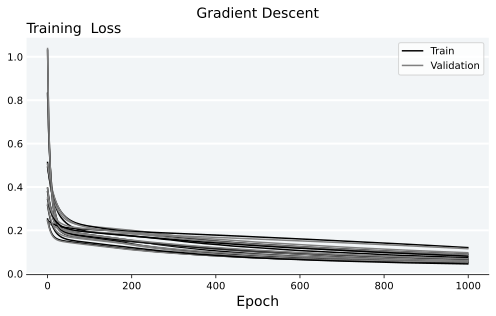

In [11]:
fig = plt.figure(dpi=300, tight_layout=True, figsize=(7, 4.5))
ax = plt.axes(facecolor=(.95, .96, .97))
ax.set_title('Gradient Descent', size=14, loc='center', pad=20)

# Plot customizations
for key in 'left', 'right', 'top':
    ax.spines[key].set_visible(False)
ax.text(0., 1.02, s='Training  Loss', transform=ax.transAxes, size=14)
ax.yaxis.set_tick_params(length=0)
ax.yaxis.grid(True, color='white', linewidth=2)
ax.set_axisbelow(True)
for i in range(jnp.minimum(10, sims)):
    if i == 1:
        plt.plot(StandardResults[i]['train_loss_history'], color='black', label='Train')
        plt.plot(StandardResults[i]['val_loss_history'], color='grey', label='Validation')
    else:
        plt.plot(StandardResults[i]['train_loss_history'], color='black')
        plt.plot(StandardResults[i]['val_loss_history'], color='grey')
plt.xlabel('Epoch', size=14)
plt.legend()
plt.show()

#### **Check for Nans**

In [12]:
for i in range(sims):
    assert jnp.isnan(model.fwd_pass(StandardResults[i]['params'], jnp.hstack((X_normalized, jnp.ones_like(Z))))).any() == False, i
    assert jnp.isnan(model.fwd_pass(StandardResults[i]['params'], jnp.hstack((X_normalized, jnp.zeros_like(Z))))).any() == False, i

#### **Out of Sample Predictions**

In [13]:
r1 = jnp.hstack([model.fwd_pass(StandardResults[i]['params'], jnp.hstack((X_normalized, jnp.ones_like(Z)))) for i in range(sims)])
r0 = jnp.hstack([model.fwd_pass(StandardResults[i]['params'], jnp.hstack((X_normalized, jnp.zeros_like(Z)))) for i in range(sims)])
idx = jnp.hstack([StandardResults[i]['val_idx'].reshape(-1,1) for i in range(sims)])
avg1 = jnp.sum(r1 * idx, axis=1)/ jnp.sum(idx, axis=1)
avg0 = jnp.sum(r0 * idx, axis=1)/ jnp.sum(idx, axis=1)
print(jnp.mean(avg1 - avg0))

0.07694269


#### **Plot Effect**

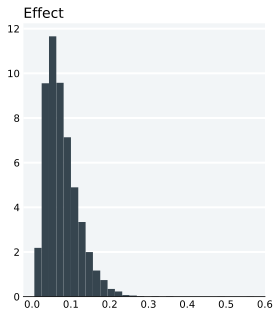

In [14]:
fig = plt.figure(dpi=300, tight_layout=True, figsize=(4, 4.5))
ax = plt.axes(facecolor=(.95, .96, .97))
ax.xaxis.set_tick_params(length=0, labeltop=False, labelbottom=True)

for key in 'left', 'right', 'top':
    ax.spines[key].set_visible(False)

ax.text(0., 1.02, s='Effect', transform=ax.transAxes, size=14)
ax.yaxis.set_tick_params(length=0)
ax.yaxis.grid(True, color='white', linewidth=2)
ax.set_axisbelow(True)
plt.hist(avg1 - avg0, color='#36454F', density=True, bins=30)
plt.show()


#### **Heterogenious Effect**

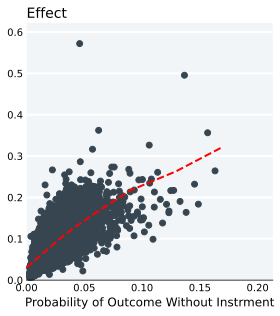

In [15]:
if outcome_status == 'binary':
    features = 1
    outer_epochs = 1000
    mlp = MLP([32, 32], jax.nn.relu)
    loess_model = Model(mlp, lambda x: x)
    supervised_loss = Supervised_Loss(mse, loess_model.embellished_fwd_pass, reg_value=0, aux_status=False)
    outer_lr = 0.01
    yuri = Trainer(supervised_loss, optax.sgd(learning_rate=outer_lr, momentum=0.9), outer_epochs)
    params = ModelParams.init_fn(jax.random.PRNGKey(0), mlp, features)
    params,_   = yuri.train(params, avg0.reshape(-1,1), (avg1-avg0).reshape(-1,1), jnp.ones_like(avg0).reshape(-1,1))

    fig = plt.figure(dpi=300, tight_layout=True, figsize=(4, 4.5))
    ax = plt.axes(facecolor=(.95, .96, .97))
    ax.xaxis.set_tick_params(length=0, labeltop=False, labelbottom=True)

    for key in 'left', 'right', 'top':
        ax.spines[key].set_visible(False)

    ax.text(0., 1.02, s='Effect', transform=ax.transAxes, size=14)
    ax.yaxis.set_tick_params(length=0)
    ax.yaxis.grid(True, color='white', linewidth=2)
    ax.set_axisbelow(True)

    plt.scatter(avg0, avg1-avg0, color='#36454F')
    xs = jnp.linspace(0, jnp.max(avg0) + 0.005, 100)
    plt.plot(xs, loess_model.fwd_pass(params, xs.reshape(-1,1)), color='red', linewidth=2, linestyle='--')
    plt.xlim(0, jnp.max(avg0) + 0.05)
    plt.ylim(0, jnp.max( avg1-avg0)+ 0.05)
    plt.xlabel("Probability of Outcome Without Instrment", size=12)
    plt.show()

In [18]:
if outcome_status == 'binary':
    StandardResults['Estimated_Effect'] = []
    fig = plt.figure(dpi=300, tight_layout=True, figsize=(7, 4.5))
    ax = plt.axes()
    ax.xaxis.set_tick_params(length=0, labeltop=False, labelbottom=True)

    for key in 'left', 'right', 'top':
        ax.spines[key].set_visible(False)

    ax.text(0., 1.02, s='P(Outcome=1|X, Z=1)', transform=ax.transAxes, size=14)
    ax.yaxis.set_tick_params(length=2)
    ax.yaxis.grid(True, color='white', linewidth=2)
    ax.set_axisbelow(True)

    
    value = 0.0
    cutoff0 = jnp.quantile(r0, 0.999).item()
    cutoff1 = jnp.quantile(r1, 0.999).item()
    for k in range(8):
        xs = jnp.linspace(0, cutoff0, 100)
        ys = jax.vmap(lambda x: x + value)(xs)
        plt.plot(xs, ys, linestyle='--', linewidth=1, color='grey')
        ax.annotate(f"{value:.2f}", (cutoff0, cutoff0 + value), color='black', fontsize=8)
        value += 0.05
    ax.annotate("Effect", (cutoff0, cutoff0 + value) , color='black', fontsize=8, weight='bold')

    for i in tqdm(range(jnp.minimum(sims, 10))):
        outcome1 = model.fwd_pass(StandardResults[i]['params'], jnp.hstack((X_normalized, jnp.ones_like(Z)))) 
        outcome0 =  model.fwd_pass(StandardResults[i]['params'], jnp.hstack((X_normalized, jnp.zeros_like(Z))) )

        Estimated_Effect = outcome1 - outcome0
        StandardResults['Estimated_Effect'].append(jnp.dot(Estimated_Effect.reshape(-1,), normalized_weights))
        
        plt.scatter(outcome0, outcome1, s=3, alpha=0.5)

    plt.xlabel("P(Outcome=1|X, Z=0)", size=14)
    plt.ylim(0, cutoff1+0.2)
    plt.xlim(0, cutoff0+0.05)
    plt.show()

100%|██████████| 10/10 [00:01<00:00,  9.80it/s]
